In [4]:
import pickle
import numpy as np
import torchvision
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torch.backends.cudnn as cudnn
from torch.optim import lr_scheduler
import matplotlib.pyplot as plt
import time
import os
import copy

import torchvision
import torchvision.transforms as transforms
from torch.utils.data.sampler import SubsetRandomSampler

In [5]:
### Transform functions
transform_train = transforms.Compose([
        transforms.RandomResizedCrop(224),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])

transform_val = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

transform_test = transforms.Compose([
    transforms.RandomResizedCrop(224),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
])

train_data = torchvision.datasets.CIFAR10(root = '/content/drive/MyDrive/cifar-10-batches-py/Train', 
                                          train=True, 
                                          transform=transform_train, 
                                          target_transform=None, 
                                          download=True)

val_data   = torchvision.datasets.CIFAR10(root = '/content/drive/MyDrive/cifar-10-batches-py/Val', 
                                          train=True, 
                                          transform=transform_val, 
                                          target_transform=None, 
                                          download=True)

test_data = torchvision.datasets.CIFAR10(root = '/content/drive/MyDrive/cifar-10-batches-py/Test', 
                                          train=False, 
                                          transform=transform_test, 
                                          target_transform=None, 
                                          download=True)

Files already downloaded and verified
Files already downloaded and verified
Files already downloaded and verified


{'train': 40000, 'val': 10000}


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


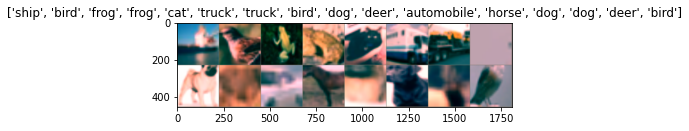

In [6]:
class_names = ('airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck') 

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
valid_size = 0.2

# Code from https://gist.github.com/kevinzakka/d33bf8d6c7f06a9d8c76d97a7879f5cb

num_train = len(train_data)
indices   = list(range(num_train))
split     = int(np.floor(valid_size * num_train))
train_idx,val_idx = indices[split:],indices[:split]
train_sampler = SubsetRandomSampler(train_idx)
val_sampler   = SubsetRandomSampler(val_idx)

train_load = torch.utils.data.DataLoader(train_data, batch_size=16, num_workers=4,sampler=train_sampler)
val_load   = torch.utils.data.DataLoader(val_data, batch_size=16, num_workers=4,sampler=val_sampler)
test_load  = torch.utils.data.DataLoader(test_data,  batch_size=16, shuffle=True, num_workers=4)

training_data = {'train':train_load,'val':val_load}
dataset_sizes = {'train':len(train_sampler),'val':len(val_sampler)}
print(dataset_sizes)
def imshow(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.51, 0.224, 0.224])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated

#print(training_data)

# Get a batch of training data
inputs, classes = next(iter(training_data['train']))

# Make a grid from batch
out = torchvision.utils.make_grid(inputs)

imshow(out, title=[class_names[x] for x in classes])

In [7]:
def train_model(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                scheduler.step()
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for inputs, labels in training_data[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f} Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_acc))

            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [8]:
model_conv = torchvision.models.resnet18(pretrained=True)
for param in model_conv.parameters():
    param.requires_grad = False

# Parameters of newly constructed modules have requires_grad=True by default
num_ftrs = model_conv.fc.in_features
model_conv.fc = nn.Linear(num_ftrs, 10)
device = 'cuda' if torch.cuda.is_available() else 'cpu'
model_conv = model_conv.to(device)

criterion = nn.CrossEntropyLoss()

#Observe that only parameters of final layer are being optimized as
# opposed to before.
optimizer_conv = optim.SGD(model_conv.fc.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_conv, step_size=7, gamma=0.1)
#print(model_conv)



Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


  0%|          | 0.00/44.7M [00:00<?, ?B/s]

In [9]:
if torch.cuda.is_available:
  print('GPU available')
else:
  print('Please set GPU via Edit -> Notebook Settings.')

GPU available


In [10]:
trained_model = train_model(model_conv, criterion, optimizer_conv,
                         exp_lr_scheduler, num_epochs=20)

Epoch 0/19
----------


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  "https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate", UserWarning)
/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_che

train Loss: 1.3889 Acc: 0.5162
val Loss: 0.8189 Acc: 0.7188

Epoch 1/19
----------
train Loss: 1.2569 Acc: 0.5612
val Loss: 0.7484 Acc: 0.7417

Epoch 2/19
----------
train Loss: 1.2444 Acc: 0.5695
val Loss: 0.7514 Acc: 0.7380

Epoch 3/19
----------
train Loss: 1.2371 Acc: 0.5710
val Loss: 0.7257 Acc: 0.7477

Epoch 4/19
----------
train Loss: 1.2290 Acc: 0.5695
val Loss: 0.7331 Acc: 0.7469

Epoch 5/19
----------
train Loss: 1.2169 Acc: 0.5777
val Loss: 0.7545 Acc: 0.7387

Epoch 6/19
----------
train Loss: 1.1747 Acc: 0.5898
val Loss: 0.6966 Acc: 0.7601

Epoch 7/19
----------
train Loss: 1.1653 Acc: 0.5970
val Loss: 0.7057 Acc: 0.7573

Epoch 8/19
----------
train Loss: 1.1709 Acc: 0.5886
val Loss: 0.7030 Acc: 0.7567

Epoch 9/19
----------
train Loss: 1.1642 Acc: 0.5963
val Loss: 0.6900 Acc: 0.7604

Epoch 10/19
----------
train Loss: 1.1727 Acc: 0.5927
val Loss: 0.6858 Acc: 0.7636

Epoch 11/19
----------
train Loss: 1.1612 Acc: 0.5975
val Loss: 0.6888 Acc: 0.7632

Epoch 12/19
----------
t

In [11]:
def validation(model, testloader):
    model.eval()
    test_loss = 0
    running_corrects = 0
    
    for inputs, labels in testloader:
        inputs = inputs.to('cuda')
        labels = labels.to(device)
        outputs = model.forward(inputs)
        _, preds = torch.max(outputs, 1)
        running_corrects += torch.sum(preds == labels.data)
    
    test_acc = running_corrects.double() / 10000

    return test_acc

In [12]:
accuracy = validation(trained_model,test_load)
print('Test Accuray: ',accuracy.item())


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


Test Accuray:  0.6183000000000001


In [13]:
def Top_Correct(model, num_images=25,out=1):
    images_so_far = 0
    fig = plt.figure()

    for b in range(1000): 
        data = next(iter(test_load))
        inputs, labels = data
        inputs, labels = inputs.cuda(), labels.cuda()

        outputs = model(inputs)
        _, preds = torch.max(outputs.data, 1)
        b += 1
        for a in range(5):
            if preds[a] == out:
            
                print('predicted: {}'.format(class_names[preds[a]]))
                imshow(torchvision.utils.make_grid(inputs.cpu().data[a]))
                images_so_far += 1

            if images_so_far == num_images:
                    return  
                
def Top_Incorrect(model, num_images=25,out=1):
    images_so_far = 0
    fig = plt.figure()

    for b in range(1000): 
        data = next(iter(test_load))
        inputs, labels = data
        inputs, labels = inputs.cuda(), labels.cuda()

        outputs = model(inputs)
        _, preds = torch.min(outputs.data, 1)
        b += 1
        for a in range(5):
            if preds[a] == out:
            
                
                print('predicted: {}'.format(class_names[preds[a]]))
                imshow(torchvision.utils.make_grid(inputs.cpu().data[a]))
                images_so_far += 1

            if images_so_far == num_images:
                    return    

Top correct predictions for class: airplane


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


predicted: airplane


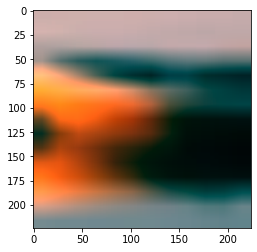

predicted: airplane


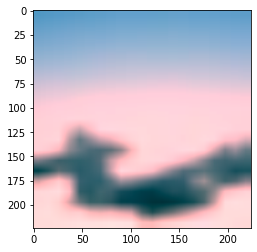

predicted: airplane


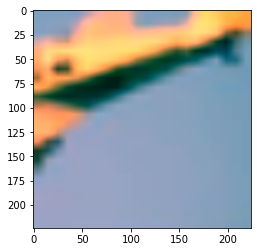

predicted: airplane


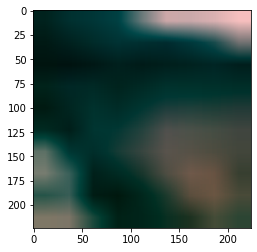

predicted: airplane


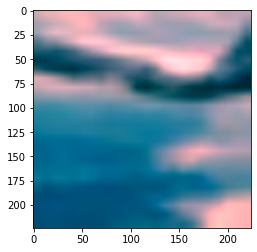

Top Incorrect predictions for class: airplane
predicted: airplane


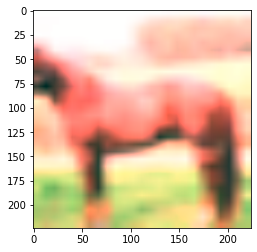

predicted: airplane


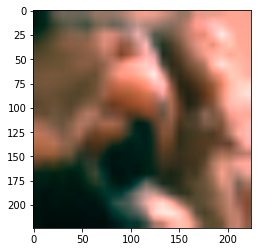

predicted: airplane


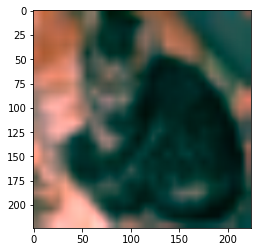

predicted: airplane


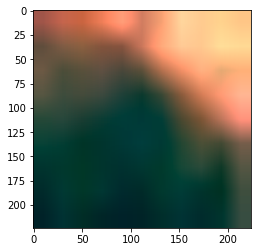

predicted: airplane


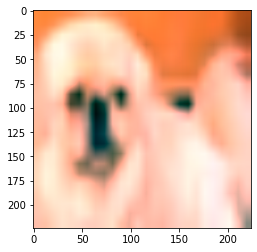

Top correct predictions for class: automobile
predicted: automobile


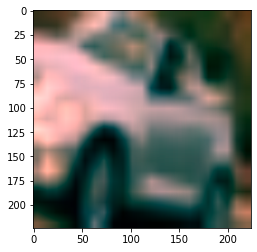

predicted: automobile


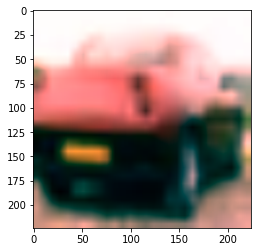

predicted: automobile


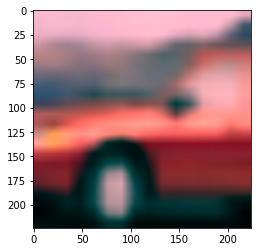

predicted: automobile


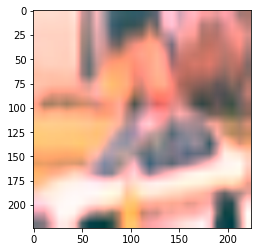

predicted: automobile


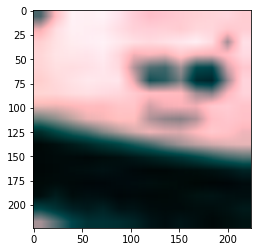

Top Incorrect predictions for class: automobile
predicted: automobile


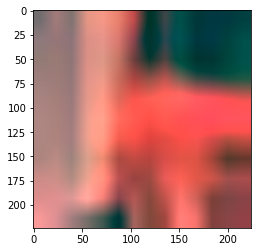

predicted: automobile


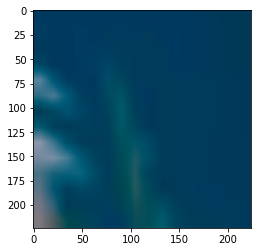

predicted: automobile


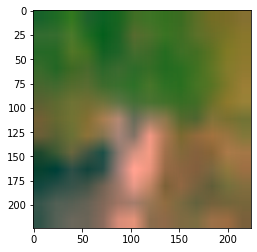

predicted: automobile


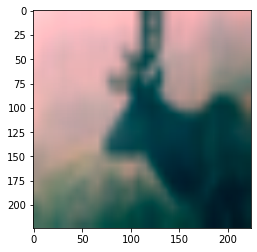

predicted: automobile


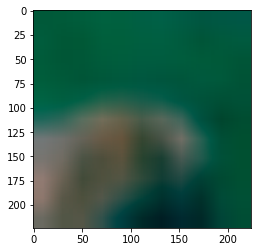

Top correct predictions for class: bird
predicted: bird


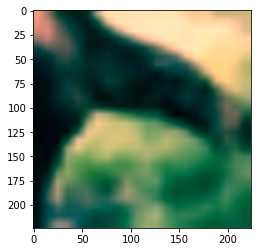

predicted: bird


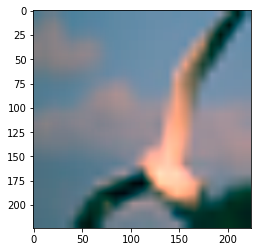

predicted: bird


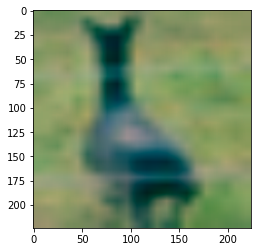

predicted: bird


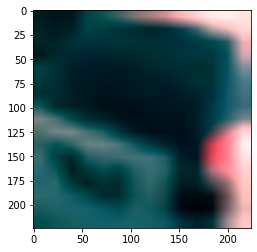

predicted: bird


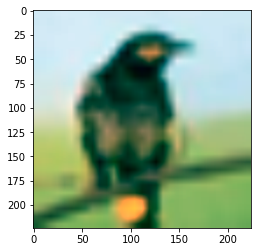

Top Incorrect predictions for class: bird
predicted: bird


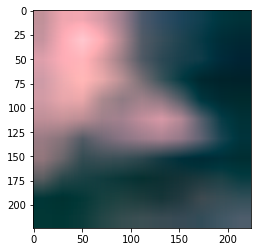

predicted: bird


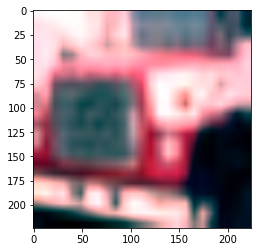

predicted: bird


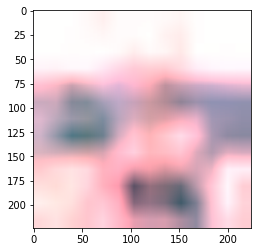

predicted: bird


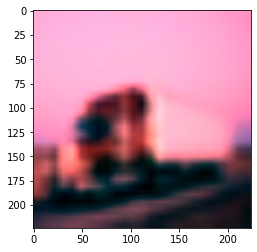

predicted: bird


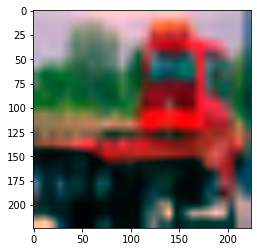

Top correct predictions for class: cat
predicted: cat


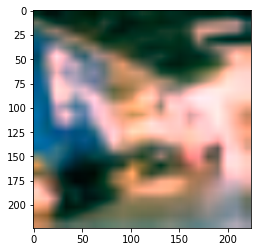

predicted: cat


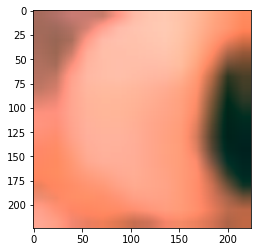

predicted: cat


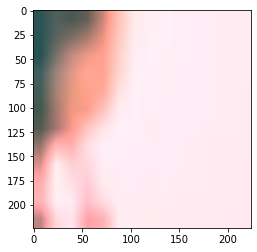

predicted: cat


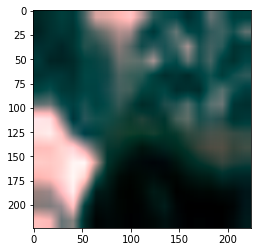

predicted: cat


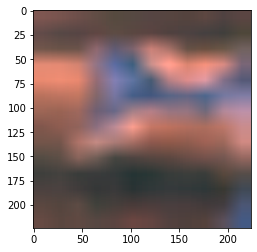

Top Incorrect predictions for class: cat
predicted: cat


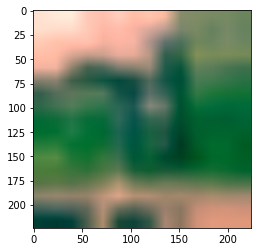

predicted: cat


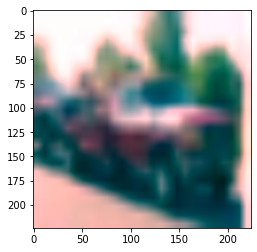

predicted: cat


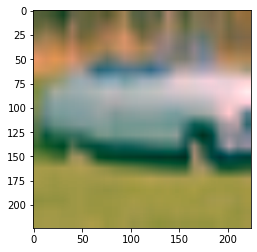

predicted: cat


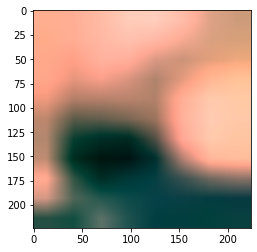

predicted: cat


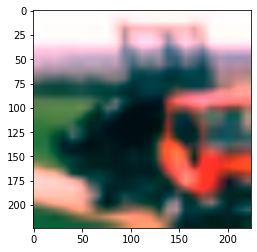

Top correct predictions for class: deer
predicted: deer


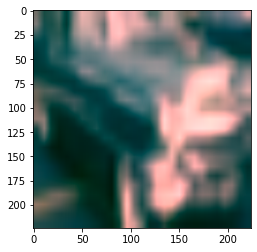

predicted: deer


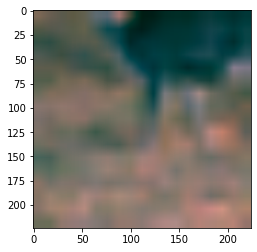

predicted: deer


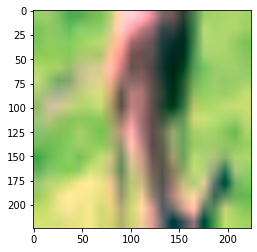

predicted: deer


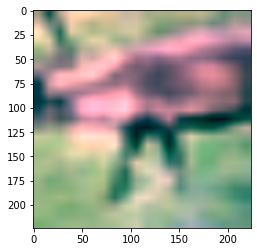

predicted: deer


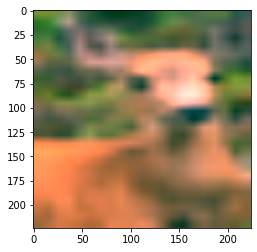

Top Incorrect predictions for class: deer
predicted: deer


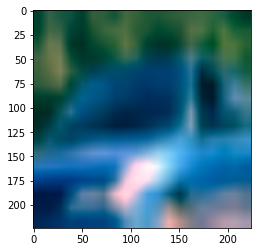

predicted: deer


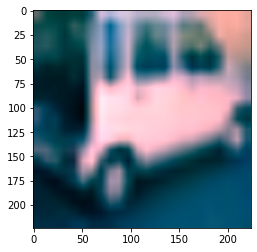

Traceback (most recent call last):
  File "/usr/lib/python3.7/multiprocessing/util.py", line 300, in _run_finalizers
    finalizer()
  File "/usr/lib/python3.7/multiprocessing/util.py", line 224, in __call__
    res = self._callback(*self._args, **self._kwargs)
  File "/usr/lib/python3.7/multiprocessing/util.py", line 133, in _remove_temp_dir
    rmtree(tempdir)
  File "/usr/lib/python3.7/shutil.py", line 498, in rmtree
    onerror(os.rmdir, path, sys.exc_info())
  File "/usr/lib/python3.7/shutil.py", line 496, in rmtree
    os.rmdir(path)
OSError: [Errno 39] Directory not empty: '/tmp/pymp-rb7x4yvi'


predicted: deer


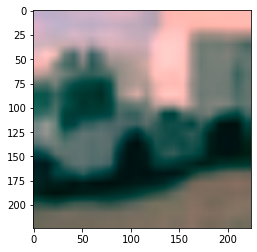

predicted: deer


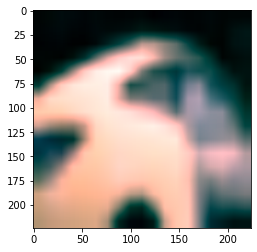

predicted: deer


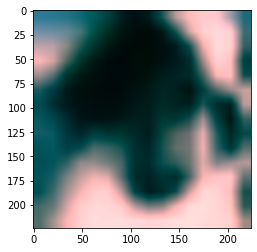

Top correct predictions for class: dog
predicted: dog


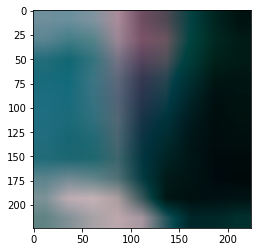

predicted: dog


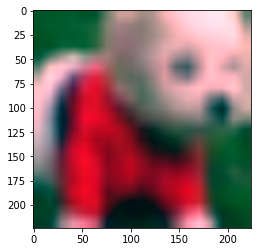

predicted: dog


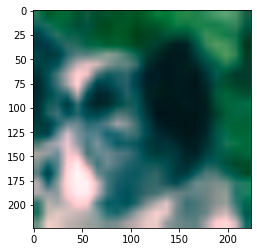

predicted: dog


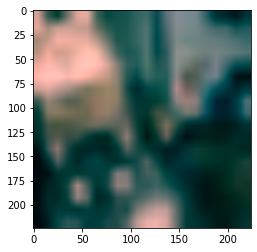

predicted: dog


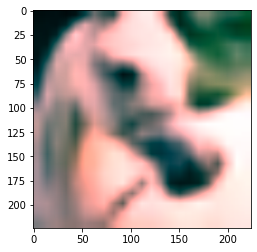

Top Incorrect predictions for class: dog
predicted: dog


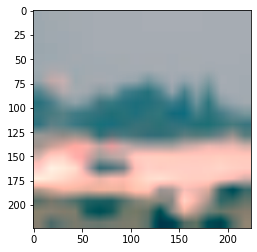

predicted: dog


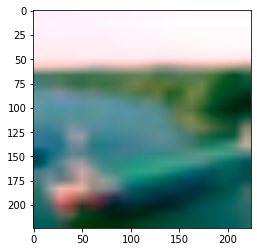

predicted: dog


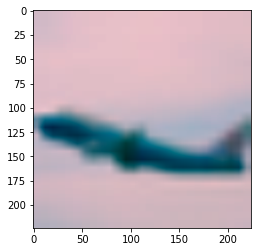

predicted: dog


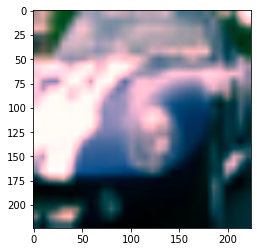

predicted: dog


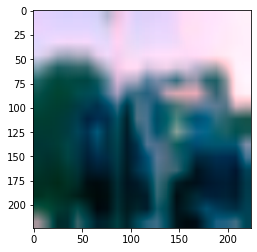

Top correct predictions for class: frog
predicted: frog


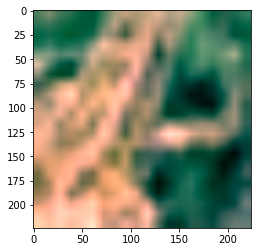

predicted: frog


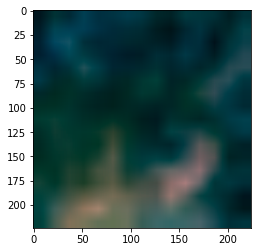

predicted: frog


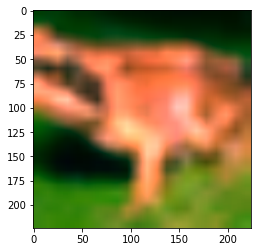

predicted: frog


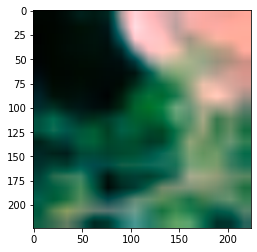

predicted: frog


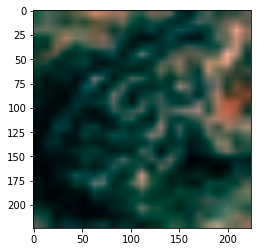

Top Incorrect predictions for class: frog
predicted: frog


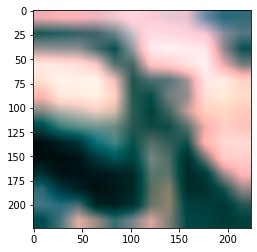

predicted: frog


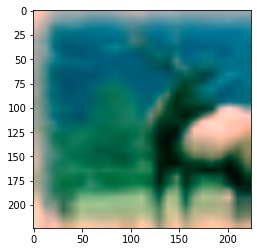

predicted: frog


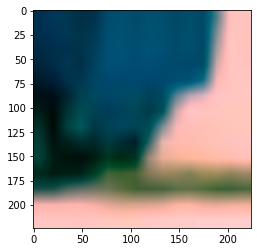

predicted: frog


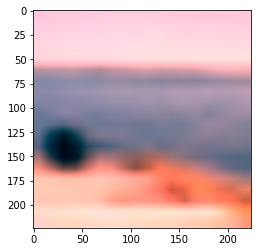

predicted: frog


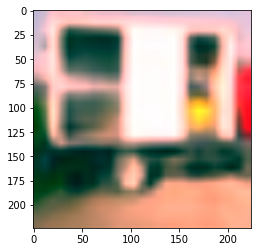

Top correct predictions for class: horse
predicted: horse


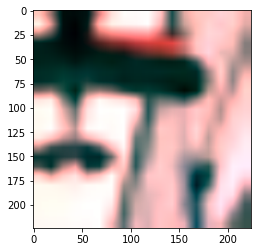

predicted: horse


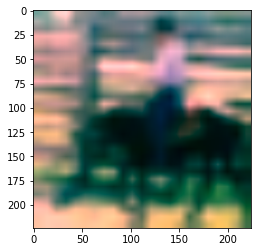

predicted: horse


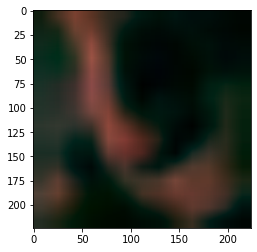

predicted: horse


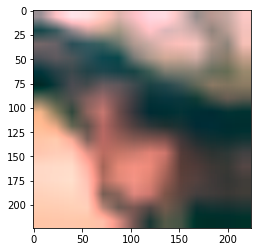

predicted: horse


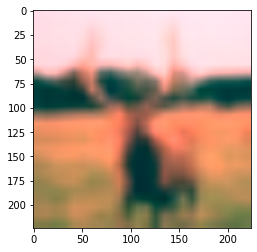

Top Incorrect predictions for class: horse
predicted: horse


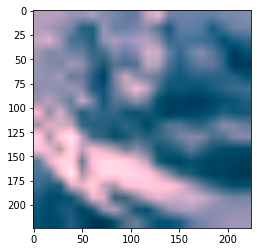

predicted: horse


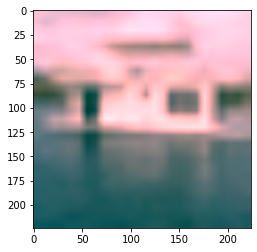

predicted: horse


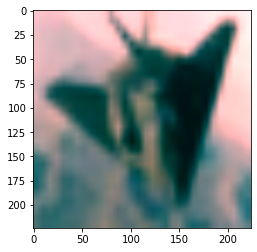

predicted: horse


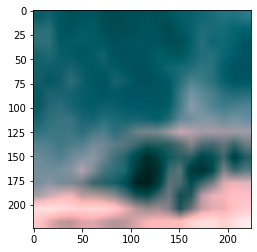

predicted: horse


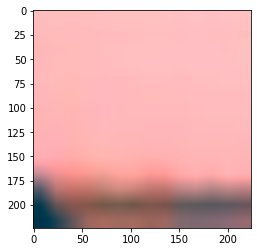

Top correct predictions for class: ship
predicted: ship


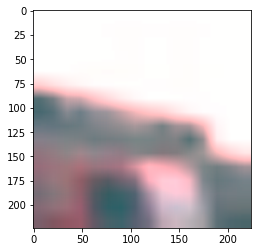

predicted: ship


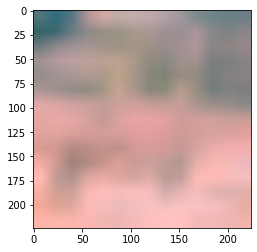

predicted: ship


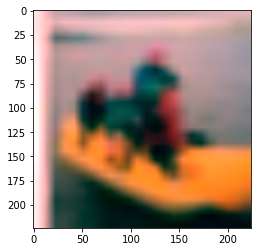

predicted: ship


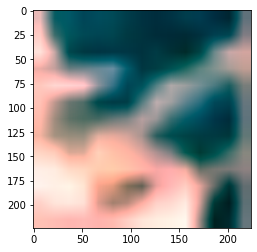

predicted: ship


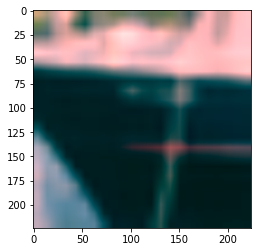

Top Incorrect predictions for class: ship
predicted: ship


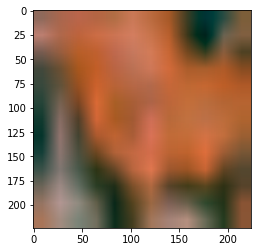

predicted: ship


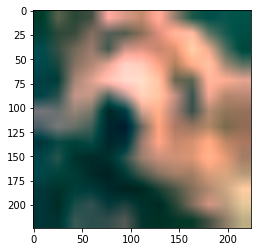

predicted: ship


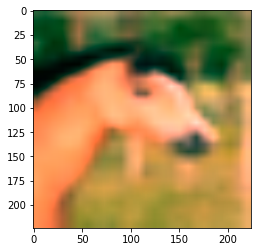

predicted: ship


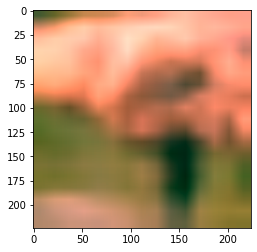

predicted: ship


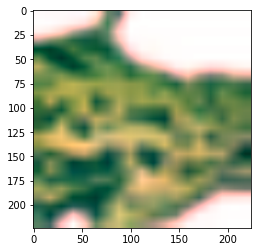

Top correct predictions for class: truck
predicted: truck


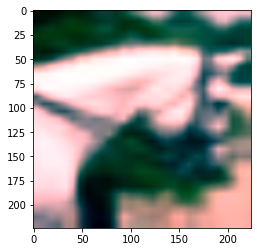

predicted: truck


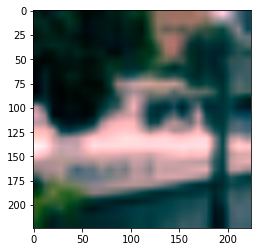

predicted: truck


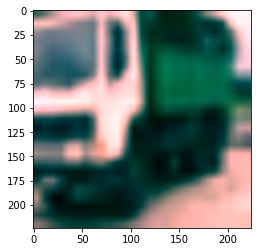

predicted: truck


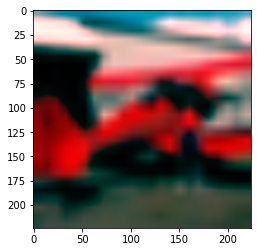

predicted: truck


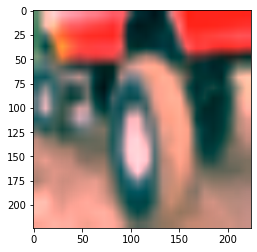

Top Incorrect predictions for class: truck
predicted: truck


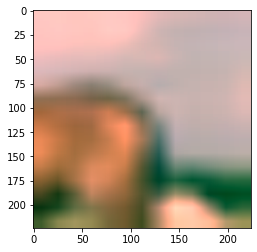

predicted: truck


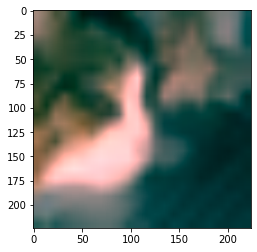

predicted: truck


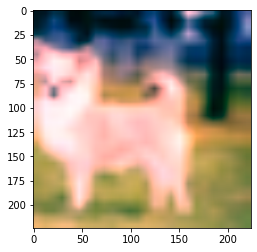

predicted: truck


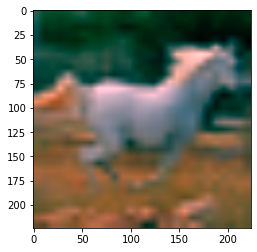

predicted: truck


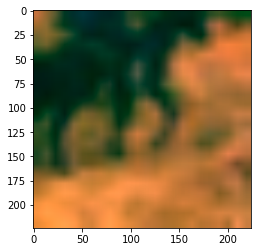

In [14]:
for i in range(10):
    print('Top correct predictions for class: {}'.format(class_names[i]))
    Top_Correct(trained_model,num_images=5,out=i)
    print('Top Incorrect predictions for class: {}'.format(class_names[i]))
    Top_Incorrect(trained_model,num_images=5,out=i)

In [15]:
#Calculating the gradient for 2 layers

model_conv_tuned = torchvision.models.resnet18(pretrained=True)
lt=8
cntr=0

for child in model_conv_tuned.children():
    cntr+=1

    if cntr < lt:
        for param in child.parameters():
            param.requires_grad = False
            
num_ftrs = model_conv_tuned.fc.in_features
model_conv_tuned.fc = nn.Linear(num_ftrs, 10)
device = 'cuda' if torch.cuda.is_available() else 'cpu'
model_conv_tuned = model_conv_tuned.to(device)

criterion = nn.CrossEntropyLoss()

#Observe that only parameters of final layer are being optimized as
# opposed to before.
optimizer_conv_tuned = optim.SGD(filter(lambda p: p.requires_grad, model_conv_tuned.parameters()), lr=0.001, momentum=0.9)


# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler_tuned = lr_scheduler.StepLR(optimizer_conv_tuned, step_size=7, gamma=0.1)

In [16]:
trained_model_tuned = train_model(model_conv_tuned, criterion, optimizer_conv_tuned,
                         exp_lr_scheduler_tuned, num_epochs=20)

Epoch 0/19
----------


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  "https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate", UserWarning)
/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_che

train Loss: 1.1138 Acc: 0.6067
val Loss: 0.4447 Acc: 0.8482

Epoch 1/19
----------
train Loss: 0.8879 Acc: 0.6916
val Loss: 0.3868 Acc: 0.8659

Epoch 2/19
----------
train Loss: 0.8296 Acc: 0.7134
val Loss: 0.3376 Acc: 0.8849

Epoch 3/19
----------
train Loss: 0.7901 Acc: 0.7267
val Loss: 0.3193 Acc: 0.8904

Epoch 4/19
----------
train Loss: 0.7404 Acc: 0.7425
val Loss: 0.2924 Acc: 0.9002

Epoch 5/19
----------
train Loss: 0.7146 Acc: 0.7510
val Loss: 0.2945 Acc: 0.9017

Epoch 6/19
----------
train Loss: 0.6576 Acc: 0.7719
val Loss: 0.2670 Acc: 0.9077

Epoch 7/19
----------
train Loss: 0.6450 Acc: 0.7767
val Loss: 0.2631 Acc: 0.9089

Epoch 8/19
----------
train Loss: 0.6308 Acc: 0.7819
val Loss: 0.2527 Acc: 0.9136

Epoch 9/19
----------
train Loss: 0.6241 Acc: 0.7837
val Loss: 0.2517 Acc: 0.9151

Epoch 10/19
----------
train Loss: 0.6176 Acc: 0.7847
val Loss: 0.2426 Acc: 0.9173

Epoch 11/19
----------
train Loss: 0.6171 Acc: 0.7871
val Loss: 0.2508 Acc: 0.9134

Epoch 12/19
----------
t

In [17]:
accuracy = validation(trained_model_tuned,test_load)
print(accuracy.item())

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


0.792


Top correct predictions for class: airplane


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


predicted: airplane


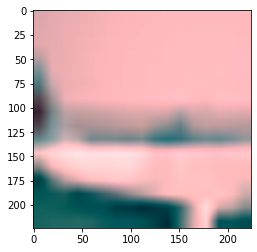

predicted: airplane


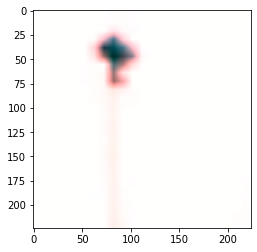

predicted: airplane


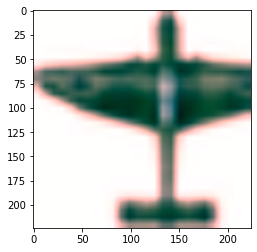

predicted: airplane


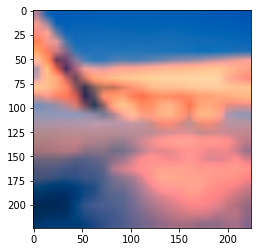

predicted: airplane


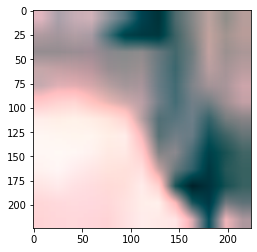

Top Incorrect predictions for class: airplane
predicted: airplane


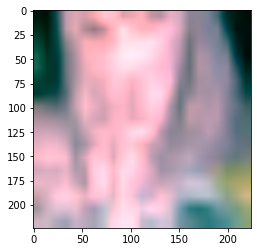

predicted: airplane


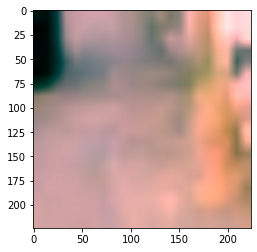

predicted: airplane


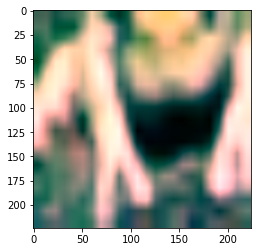

predicted: airplane


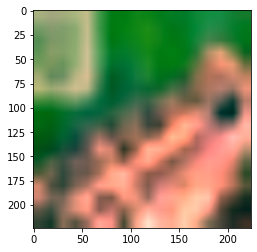

predicted: airplane


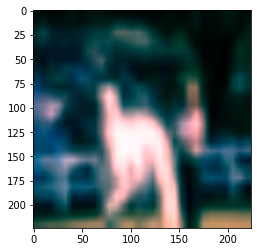

Top correct predictions for class: automobile
predicted: automobile


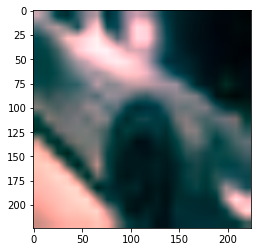

predicted: automobile


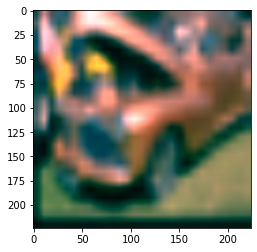

predicted: automobile


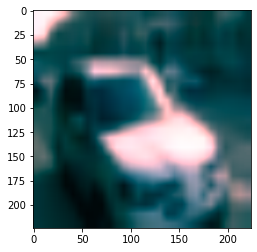

predicted: automobile


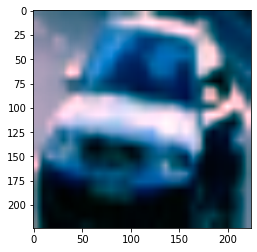

predicted: automobile


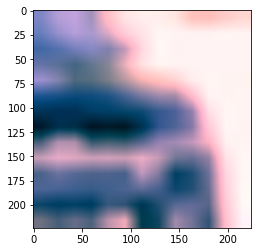

Top Incorrect predictions for class: automobile
predicted: automobile


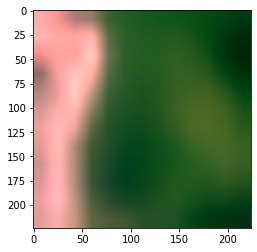

predicted: automobile


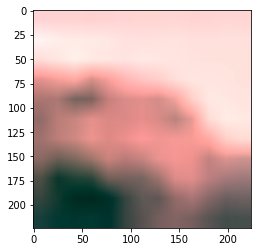

predicted: automobile


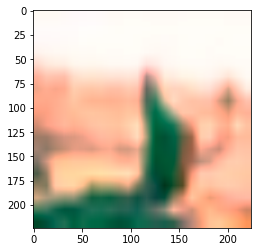

predicted: automobile


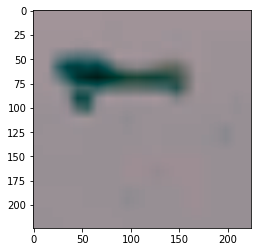

predicted: automobile


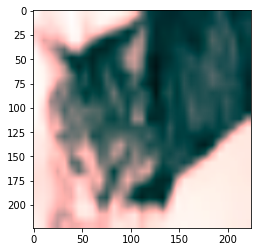

Top correct predictions for class: bird
predicted: bird


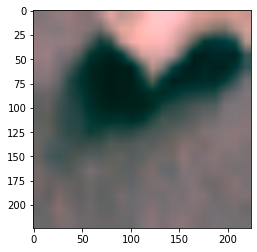

predicted: bird


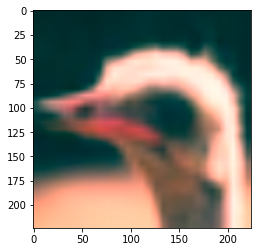

predicted: bird


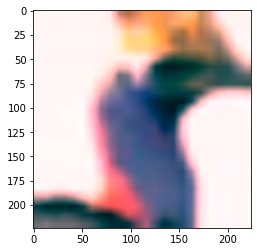

predicted: bird


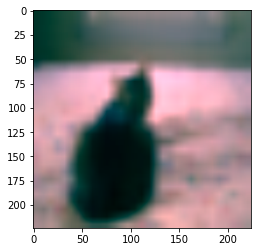

predicted: bird


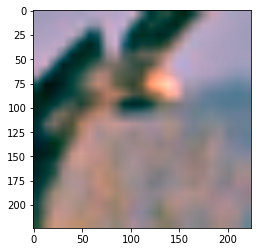

Top Incorrect predictions for class: bird
predicted: bird


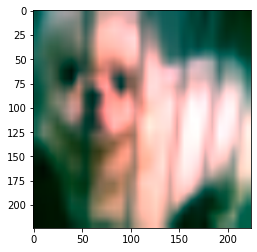

predicted: bird


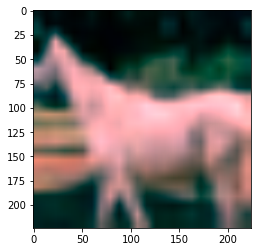

predicted: bird


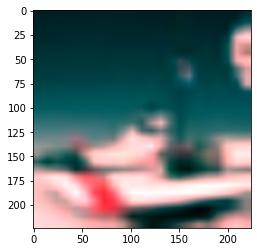

predicted: bird


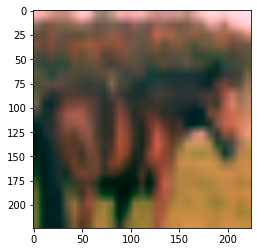

predicted: bird


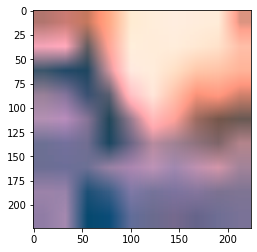

Top correct predictions for class: cat
predicted: cat


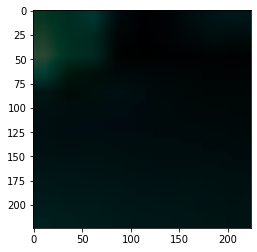

predicted: cat


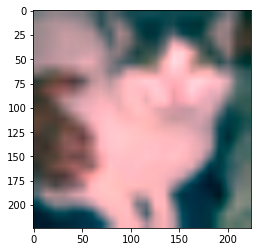

predicted: cat


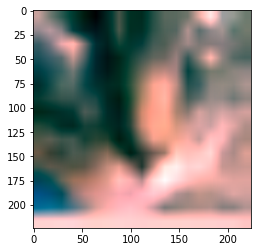

predicted: cat


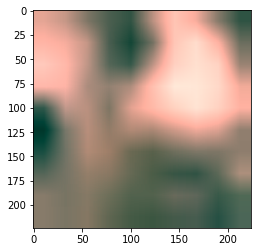

predicted: cat


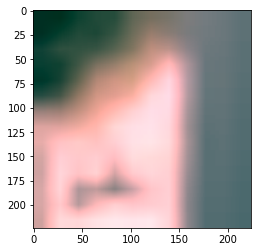

Top Incorrect predictions for class: cat
predicted: cat


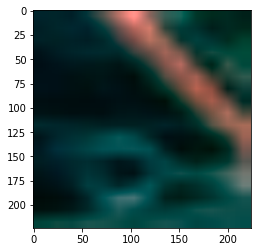

predicted: cat


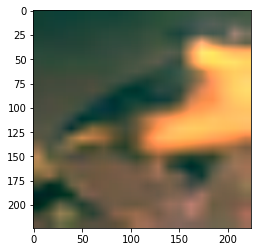

predicted: cat


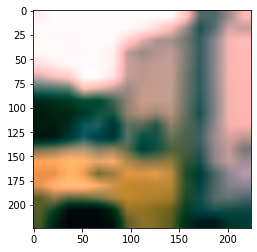

predicted: cat


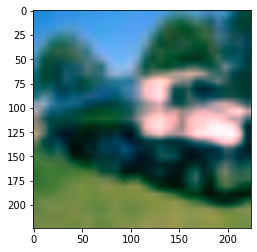

predicted: cat


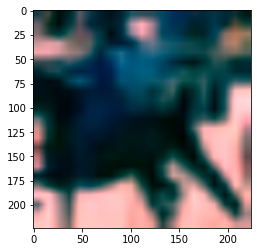

Top correct predictions for class: deer
predicted: deer


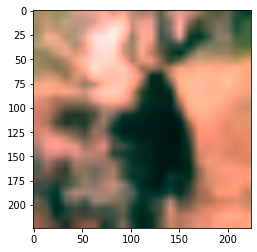

predicted: deer


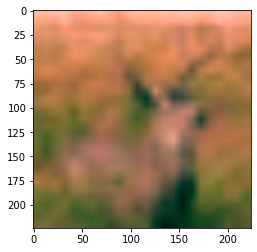

predicted: deer


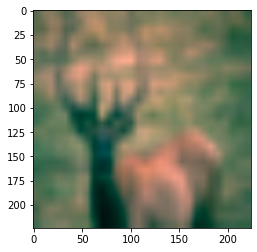

predicted: deer


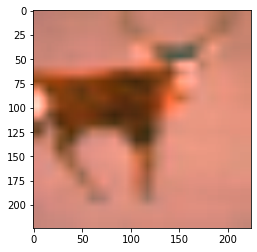

predicted: deer


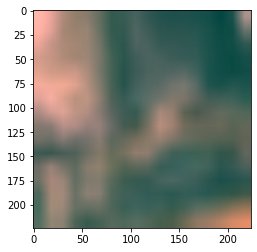

Top Incorrect predictions for class: deer
predicted: deer


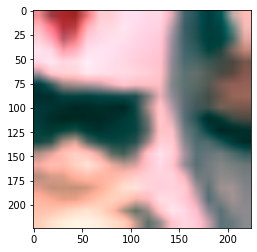

predicted: deer


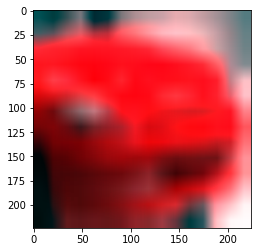

predicted: deer


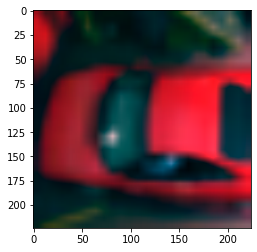

predicted: deer


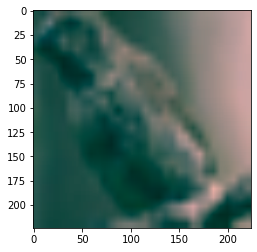

predicted: deer


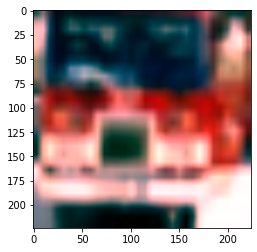

Top correct predictions for class: dog
predicted: dog


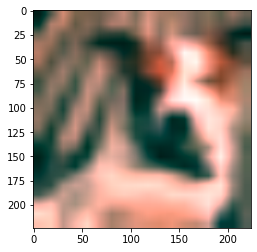

predicted: dog


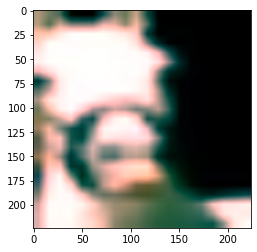

predicted: dog


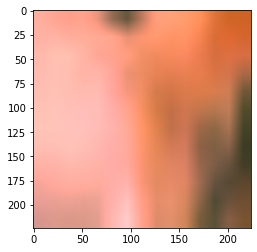

predicted: dog


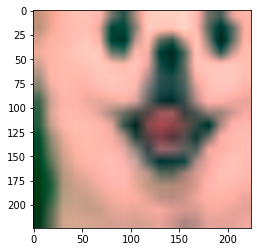

predicted: dog


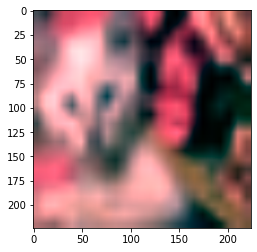

Top Incorrect predictions for class: dog
predicted: dog


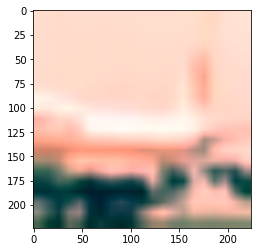

predicted: dog


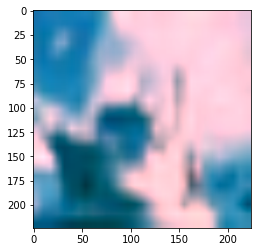

predicted: dog


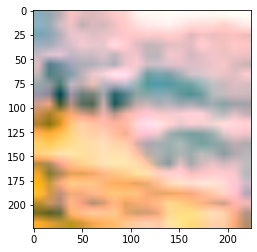

predicted: dog


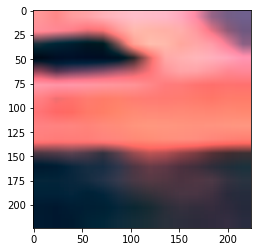

predicted: dog


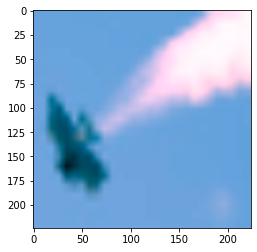

Top correct predictions for class: frog
predicted: frog


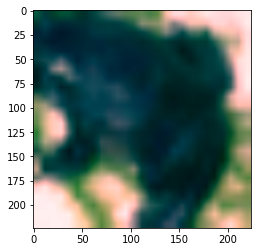

predicted: frog


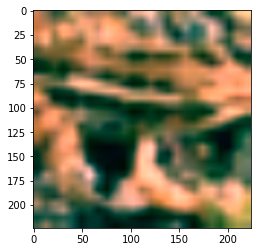

predicted: frog


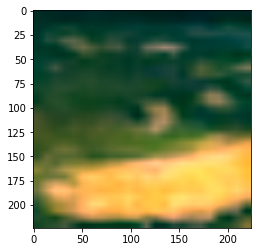

predicted: frog


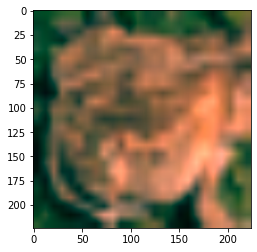

predicted: frog


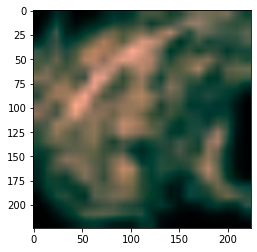

Top Incorrect predictions for class: frog
predicted: frog


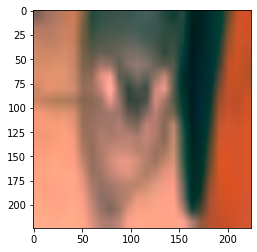

predicted: frog


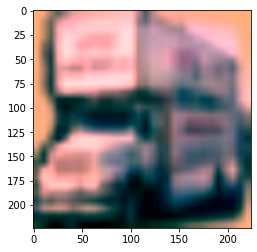

predicted: frog


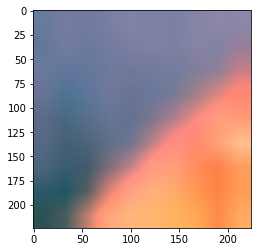

predicted: frog


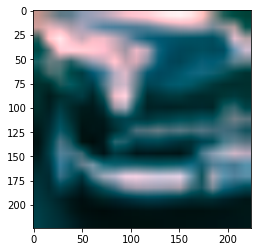

predicted: frog


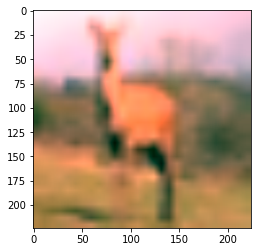

Top correct predictions for class: horse
predicted: horse


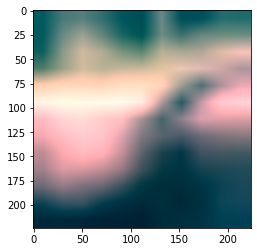

predicted: horse


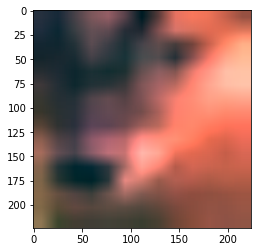

predicted: horse


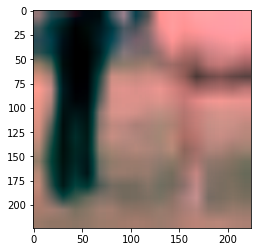

predicted: horse


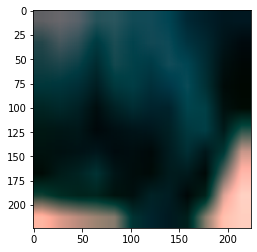

predicted: horse


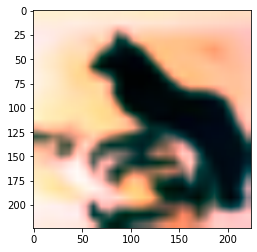

Top Incorrect predictions for class: horse
predicted: horse


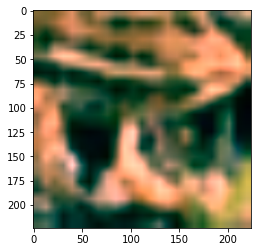

predicted: horse


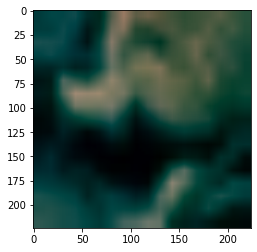

predicted: horse


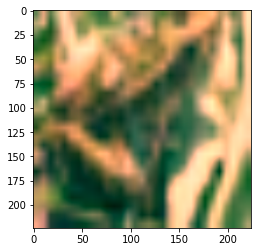

predicted: horse


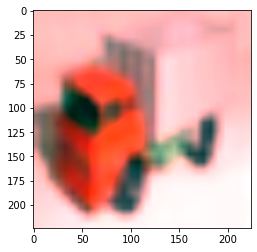

predicted: horse


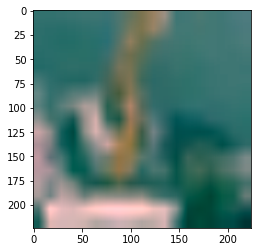

Top correct predictions for class: ship
predicted: ship


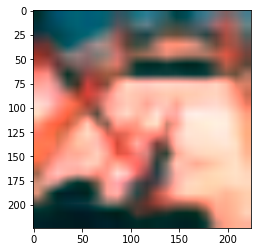

predicted: ship


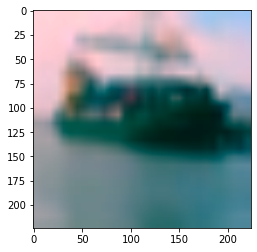

predicted: ship


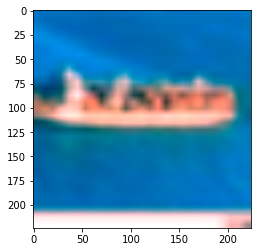

predicted: ship


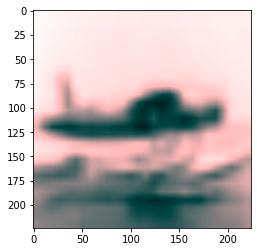

predicted: ship


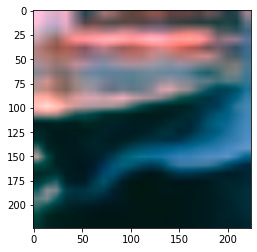

Top Incorrect predictions for class: ship
predicted: ship


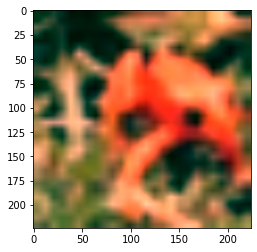

predicted: ship


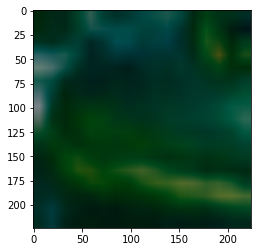

predicted: ship


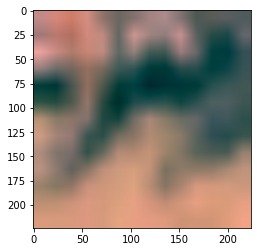

predicted: ship


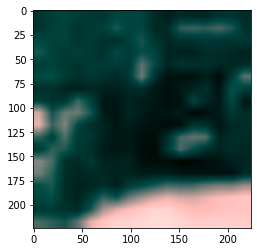

predicted: ship


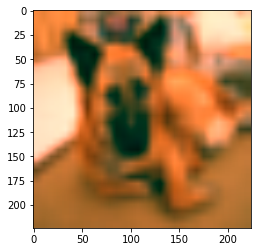

Top correct predictions for class: truck
predicted: truck


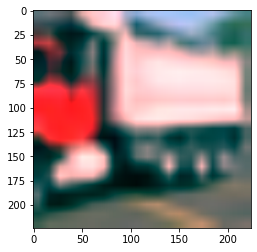

predicted: truck


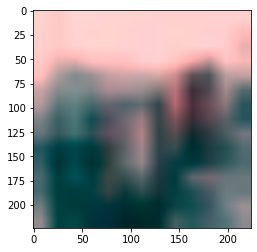

predicted: truck


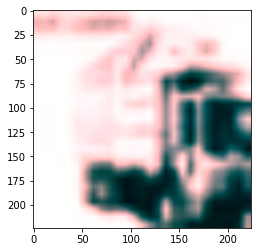

predicted: truck


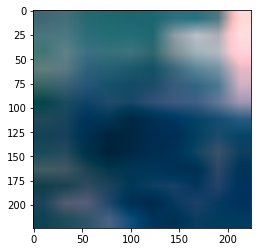

predicted: truck


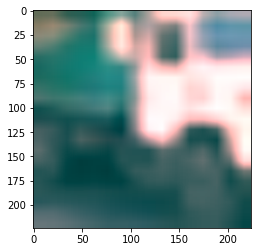

Top Incorrect predictions for class: truck
predicted: truck


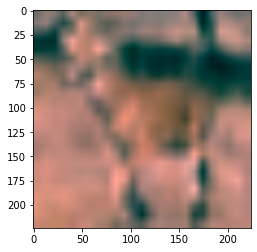

predicted: truck


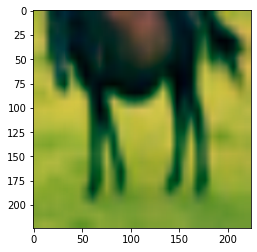

predicted: truck


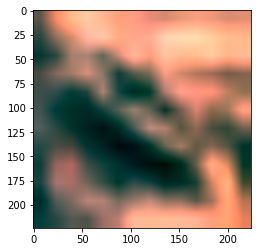

predicted: truck


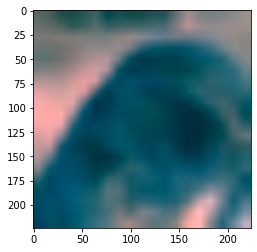

predicted: truck


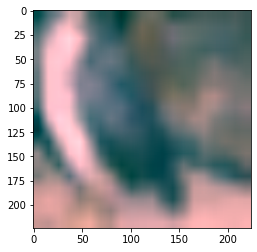

In [18]:
for i in range(10):
    print('Top correct predictions for class: {}'.format(class_names[i]))
    Top_Correct(trained_model_tuned,num_images=5,out=i)
    print('Top Incorrect predictions for class: {}'.format(class_names[i]))
    Top_Incorrect(trained_model_tuned,num_images=5,out=i)